<a href="https://colab.research.google.com/github/ningen-sekai/bulldozer_price_prediction/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# End-to-end Multi-class Dog breed Classification

This notebook builds an end-to-end image classifier using TenserFlow and TenserFlow Hub.

## 1. Problem

Identifying the breed of a dog given it's image.

## 2. Data

The data we're using is from Kaggle's dog breed competition:

https://www.kaggle.com/competitions/dog-breed-identification/data 

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:
  * We're dealing with images (unstructered data) so it's probably best we use deep learning/transfer learning
  * There are 120 breeds of dogs
  * There are around 10000+ images in the training set
  * There are around 10000+ images in the test set

# Getting out Workspace ready

* Import tesnerflow
* Import tesnerflow hub
* Make sure we're using a GPU

In [1]:
#!unzip '/content/drive/MyDrive/Colab Notebooks/dog-breed-identification.zip' -d '/content/drive/MyDrive/Colab Notebooks/'

In [2]:
import tensorflow as tf

In [3]:
import tensorflow_hub as hub

In [4]:
import pandas as pd

# Getting the data ready 

In [5]:
labels_csv = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/labels.csv')

In [6]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [7]:
labels_csv['breed'].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

### How many images of each breed do we have

<AxesSubplot:>

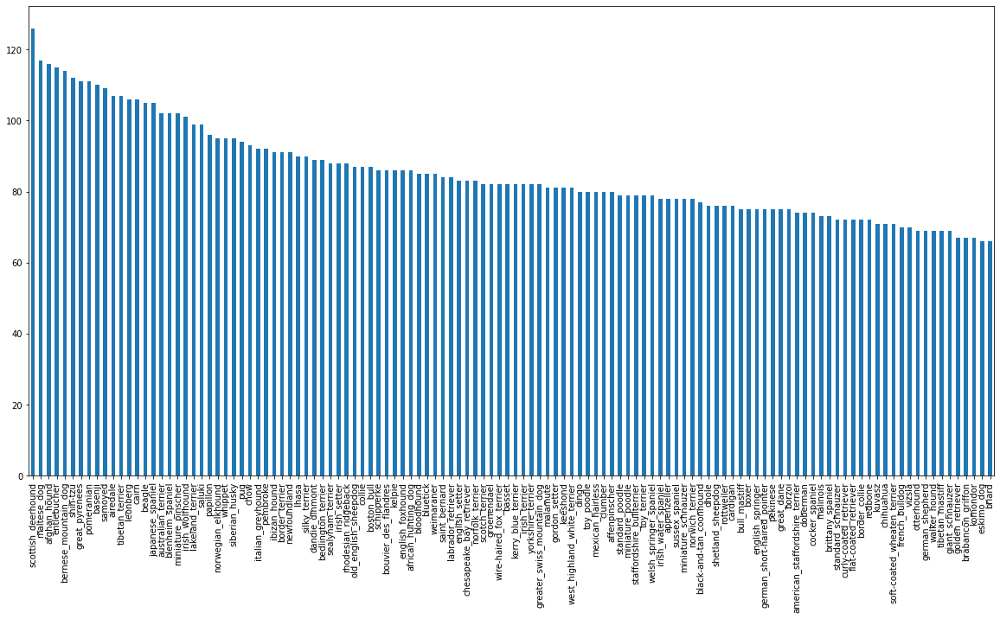

In [8]:
labels_csv['breed'].value_counts().plot.bar(figsize=(20,10))


### Getting images and their labels

Since we've got the image ID's and their labels in a DataFrame (`labels_csv`), we'll use it to create:
* A list a filepaths to training images
* An array of all labels
* An array of all unique labels

In [9]:
filenames = ['drive/My Drive/Colab Notebooks/train/' + fname for fname in labels_csv['id'] + '.jpg']

In [10]:
filenames[:10]

['drive/My Drive/Colab Notebooks/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Colab Notebooks/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Colab Notebooks/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Colab Notebooks/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Colab Notebooks/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Colab Notebooks/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Colab Notebooks/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Colab Notebooks/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Colab Notebooks/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Colab Notebooks/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

Now we've got our image filepaths together, let's get the labels.

We'll take them from `labels_csv` and turn them into a NumPy array.

In [11]:
import numpy as np
labels = labels_csv['breed'].to_numpy()

In [12]:
labels[:10]

array(['boston_bull', 'dingo', 'pekinese', 'bluetick', 'golden_retriever',
       'bedlington_terrier', 'bedlington_terrier', 'borzoi', 'basenji',
       'scottish_deerhound'], dtype=object)

In [13]:
len(labels) == len(filenames)

True

In [14]:
unique_breeds = np.unique(labels)

In [15]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

## Going through the list of `labels` and comparing them to unique breeds and creating a list of booleans indicating which one is the real label (`True`) and which ones aren't (`False`).

In [16]:
#Turn every label into a boolean array
boolean_labels = [label == np.array(unique_breeds) for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [17]:
len(boolean_labels)

10222

# Creating validation set
Since the dataset from Kaggle doesn't come with a validation set, let's make one.

We could use Scikit-Learn's [train_test_split](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html) function or we could simply make manual splits of the data.

For accessibility later, let's save our filenames variable to `X` (data) and our labels to `y`.

In [18]:
X = filenames
y = boolean_labels

In [19]:
NUM_IMAGES = 1000 #@param {type:'slider', min: 1000, max: 10000, step : 1000}

In [20]:
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                    y[:NUM_IMAGES],
                                                    test_size=0.2,
                                                    random_state=42)

# Preprocessing images
To preprocess our images into Tensors we're going to write a function which does a few things:
1. Takes an image filename as input.
2. Uses TensorFlow to read the file and save it to a variable, `image`.
3. Turn our `image` (a jpeg file) into Tensors.
4. Resize the `image` to be of shape (224, 224).
5. Return the modified `image`.

In [21]:
IMG_SIZE = 224

def process_image(image_path, img_size = IMG_SIZE):
  #read in an image file
  image = tf.io.read_file(image_path)
  #turn the jpeg into numerical tensor with 3 color channels (rgb)
  image = tf.image.decode_jpeg(image, channels=3)
  #convert the color channels values from 0-255 to 0-1
  image = tf.image.convert_image_dtype(image,tf.float32)
  #resise the image to our desired value
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

# Turning our data into batches

In [22]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  image = process_image(image_path)
  return image,label

Because we'll be dealing with 3 different sets of data (training, validation and test), we'll make sure the function can accomodate for each set.

We'll set a default batch size of 32 because [according to Yann Lecun](https://twitter.com/ylecun/status/989610208497360896?s=20) , friends don't let friends train with batch sizes over 32.

In [23]:
BATCH_SIZE = 32

def create_data_batch(X, y=None, batch_size= BATCH_SIZE, valid_data = False, test_data = False):
  '''Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels)'''
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch 
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    
    data = data.shuffle(buffer_size = len(X))

    data_batch = data.map(get_image_label).batch(BATCH_SIZE)

    return data_batch


In [24]:
train_data = create_data_batch(X_train, y_train)
val_data = create_data_batch(X_val, y_val, valid_data = True)

Creating training data batches...
Creating validation data batches...


# Visualizing data batches

In [25]:
import matplotlib.pyplot as plt 

def show_25_images(images, label):
  plt.figure(figsize=(10,10))
  for i in range(25):
    ax= plt.subplot(5,5,i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[label[i].argmax()])
    plt.axis('off')

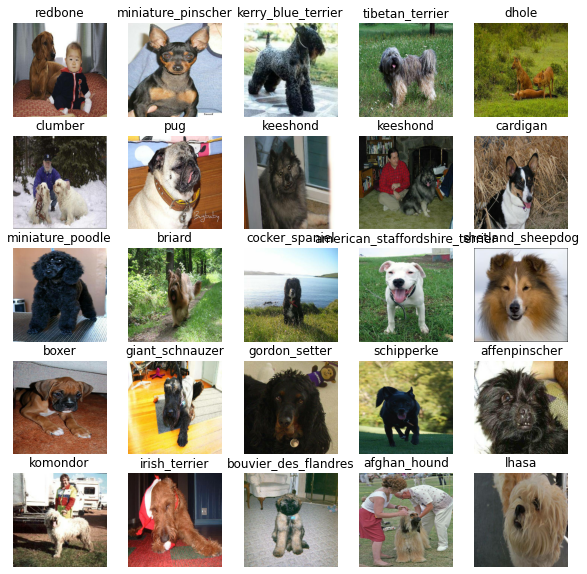

In [26]:
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

# Building a model

Before we build a model, there are a few things we need to define:
* The input shape (images, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use.

In [27]:
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]

OUTPUT_SHAPE = len(unique_breeds)

MODEL_URL = 'https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5'

## We've got our inputs, outputs and , model ready to go. Let's put them into a Keras deep learning model!

Let's create a function which:
* Takes the input shape, output shape and the model we've chosen's URL as parameters.
* Defines the layers in a Keras model in a sequential fashion (do this first, then this, then that).
* Compiles the model (says how it should be evaluated and improved).
* Builds the model (tells it what kind of input shape it'll be getting).
* Returns the model.

In [28]:
def create_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):
  print("Building model with:", MODEL_URL)

  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL),
      tf.keras.layers.Dense(units = OUTPUT_SHAPE,
                            activation='softmax')])
  
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics=['accuracy']
  )

  model.build(INPUT_SHAPE)

  return model

In [29]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks 

### TensorBoard callback

To set up a TensorBoard callback and view TensorBoard in a notebook, we need to do three things:
1. Load the TensorBoard notebook extension.
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize the our models training logs using the `%tensorboard` magic function (we'll do this later on).

In [30]:
%load_ext tensorboard

In [31]:
import datetime 
import os
def create_tensorboard_callback():
  logdir = os.path.join('/content/drive/MyDrive/Colab Notebooks/logs',
                      datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  
  return tf.keras.callbacks.TensorBoard(logdir)



### Early stopping callback 

In [32]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor = 'val_accuracy',
                                                  patience = 3)

# Training a model 
Our first model is only going to be trained on 1000 images. Or trained on 800 images and then validated on 200 images, meaning 1000 images total or about 10% of the total data.

We do this to make sure everything is working. And if it is, we can step it up later and train on the entire training dataset.

In [33]:
NUM_EPOCHS = 100 #@param {type: "slider", min: 10, max : 100, step: 10}

Let's create a simple function which trains a model. The function will:
* Create a model using `create_model()`.
* Setup a TensorBoard callback using `create_tensorboard_callback()` (we do this here so it creates a log directory of the current date and time).
* Call the `fit()` function on our model passing it the training data, validatation data, number of epochs to train for and the callbacks we'd like to use.
* Return the fitted model.

In [34]:
def train_model():

  model = create_model()

  tensorboard = create_tensorboard_callback()

  model.fit(x = train_data,
            epochs = NUM_EPOCHS,
            validation_data = val_data,
            validation_freq = 1,
            callbacks = [tensorboard, early_stopping])
  
  return model 

In [35]:
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 255s 10s/step - loss: 4.6374 - accuracy: 0.0887 - val_loss: 3.3054 - val_accuracy: 0.2600
Epoch 2/100
25/25 [==============================] - 4s 154ms/step - loss: 1.6421 - accuracy: 0.6938 - val_loss: 2.0217 - val_accuracy: 0.5250
Epoch 3/100
25/25 [==============================] - 4s 176ms/step - loss: 0.5620 - accuracy: 0.9463 - val_loss: 1.5409 - val_accuracy: 0.6450
Epoch 4/100
25/25 [==============================] - 4s 145ms/step - loss: 0.2492 - accuracy: 0.9950 - val_loss: 1.3868 - val_accuracy: 0.6600
Epoch 5/100
25/25 [==============================] - 4s 152ms/step - loss: 0.1464 - accuracy: 0.9975 - val_loss: 1.3232 - val_accuracy: 0.6650
Epoch 6/100
25/25 [==============================] - 4s 150ms/step - loss: 0.1003 - accuracy: 0.9987 - val_loss: 1.2725 - val_accuracy: 0.6800
Epoch 7/100
25/25 [==============================

#### Checking the TensorBoard logs

In [36]:
%tensorboard --logdir drive/My\ Drive/Colab\ Notebooks/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

Before we scale up and train on more data, let's see some other ways we can evaluate our model. Because although accuracy is a pretty good indicator of how our model is doing, it would be even better if we could could see it in action.

In [37]:
predictions = model.predict(val_data, verbose = True)
predictions.shape

7/7 [==============================] - 4s 164ms/step


(200, 120)

In [38]:
index = 0
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index : {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[3.63526458e-04 6.52814269e-05 1.75021170e-03 2.45804040e-05
 1.12496789e-04 1.23211075e-05 2.61765141e-02 2.97689810e-04
 2.40249166e-04 1.26595283e-03 2.10114158e-04 1.33966547e-04
 1.77334718e-04 1.97291301e-05 1.11666380e-03 6.88115717e-04
 2.58008076e-04 3.44286978e-01 1.58165654e-04 4.88479964e-05
 4.36689588e-04 6.75094998e-05 5.67240022e-06 1.64532708e-03
 6.29008136e-05 2.57100008e-04 2.54850030e-01 9.95251030e-05
 8.51848527e-05 1.21973979e-04 2.18183995e-05 1.78544247e-03
 3.89293098e-04 1.92416010e-05 2.72007892e-05 1.86166856e-02
 8.24901726e-05 1.21235236e-04 2.81838311e-05 9.16450299e-05
 7.96551758e-04 2.38611628e-05 1.43272891e-05 5.40515292e-04
 4.27231171e-05 5.47872514e-05 7.53536369e-06 2.91863777e-04
 1.09083674e-04 3.66229651e-04 9.89777385e-04 8.41813453e-05
 3.58029269e-04 1.03991144e-04 1.75389694e-04 1.52338704e-04
 2.28581717e-04 2.81832949e-03 4.77042864e-04 1.12139948e-01
 3.23215034e-04 9.89278124e-05 4.13271249e-04 6.91871319e-05
 3.82939092e-04 1.813343

Having this information is great but it would be even better if we could compare a prediction to its true label and original image.

To help us, let's first build a little function to convert prediction probabilities into predicted labels.

In [39]:
def get_pred_label(pred_probabilities):
  return unique_breeds[np.argmax(pred_probabilities)]

In [40]:
def unbatchify(data):
  images_ = []
  labels_ = []

  for image, label in data.unbatch().as_numpy_iterator():
    images_.append(image)
    labels_.append(unique_breeds[np.argmax(label)])

  return images_, labels_ 

In [41]:
val_images, val_labels = unbatchify(val_data)

In [42]:
def plot_pred(prediction_probablities, labels, images, n=1):
  pred_prob, true_label, image = prediction_probablities[n], labels[n], images[n]

  pred_label = get_pred_label(pred_prob)
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  if pred_label == true_label:
    color = "green"
  else:
    color = "red"
  
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                   np.max(pred_prob)*100,
                                   true_label),
                                   color = color)

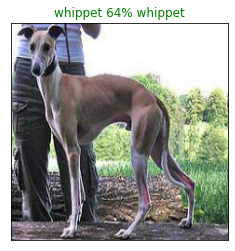

In [43]:
plot_pred(prediction_probablities=predictions,labels = val_labels, images = val_images, n=13)

In [44]:
def plot_pred_conf(prediction_probablities, labels, n=1):

  pred_prob, true_label = prediction_probablities[n], labels[n]

  pred_label = get_pred_label(pred_prob)

  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  top_10_pred_values = pred_prob[ top_10_pred_indexes]
  top_10_pred_labels = unique_breeds[ top_10_pred_indexes]


  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color = 'grey')
  
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation = "vertical")
  

  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

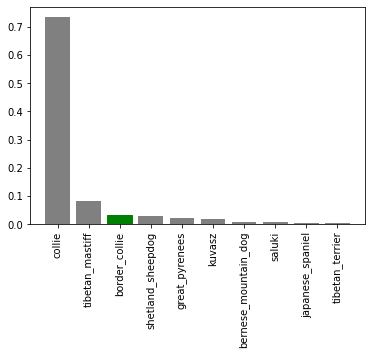

In [45]:
plot_pred_conf(prediction_probablities=predictions, labels = val_labels, n=9)

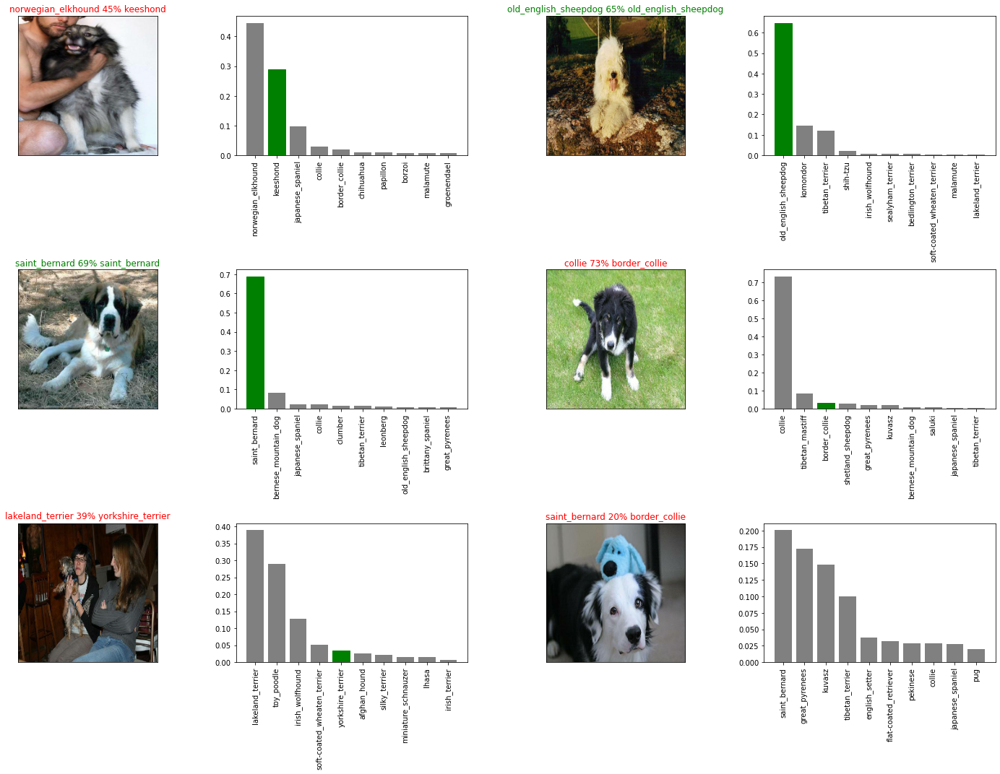

In [46]:
i_multiplier = 6
num_rows = 3
num_columns = 2
num_images = num_rows * num_columns
plt.figure(figsize=(10*num_columns, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2* num_columns, 2*i+1)
  plot_pred(prediction_probablities = predictions,
            labels= val_labels,
            images = val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2* num_columns, 2*i+2)
  plot_pred_conf(prediction_probablities = predictions,
            labels= val_labels,
            n=i+i_multiplier)
plt.tight_layout()
plt.show()

In [47]:
def save_model(model, suffix = None):
  modeldir = os.path.join("/content/drive/MyDrive/Colab Notebooks/models", datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + '-' + suffix + ".h5"
  print(f"Saving model to {model_path}...")
  model.save(model_path)
  return model_path

In [48]:
def load_model(model_path):
  print(f"Loading saved model from: {model_path}...")
  model = tf.keras.models.load_model(model_path,
                              custom_objects = {"KerasLayer": hub.KerasLayer})
  return model

## Saving and reloading the model

In [49]:
save_model(model, suffix = "1000-images-mobilenetv2-Adam")

Saving model to /content/drive/MyDrive/Colab Notebooks/models/20230224-16541677257677-1000-images-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/Colab Notebooks/models/20230224-16541677257677-1000-images-mobilenetv2-Adam.h5'

In [50]:
loaded_1000_images_model = load_model("/content/drive/MyDrive/Colab Notebooks/models/20230223-13521677160343-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: /content/drive/MyDrive/Colab Notebooks/models/20230223-13521677160343-1000-images-mobilenetv2-Adam.h5...


## Training a model (on the full data)

Now we know our model works on a subset of the data, we can start to move forward with training one on the full data.

In [51]:
full_data = create_data_batch(X,y)

Creating training data batches...


In [52]:
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [53]:
full_model_tensorboard = create_tensorboard_callback()
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience = 3)


In [54]:
full_model.fit(x=full_data,
               epochs = NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 2045s 6s/step - loss: 1.3391 - accuracy: 0.6649
Epoch 2/100
320/320 [==============================] - 38s 119ms/step - loss: 0.3951 - accuracy: 0.8865
Epoch 3/100
320/320 [==============================] - 37s 115ms/step - loss: 0.2373 - accuracy: 0.9353
Epoch 4/100
320/320 [==============================] - 36s 113ms/step - loss: 0.1528 - accuracy: 0.9627
Epoch 5/100
320/320 [==============================] - 36s 114ms/step - loss: 0.1052 - accuracy: 0.9793
Epoch 6/100
320/320 [==============================] - 38s 119ms/step - loss: 0.0762 - accuracy: 0.9870
Epoch 7/100
320/320 [==============================] - 36s 113ms/step - loss: 0.0586 - accuracy: 0.9914
Epoch 8/100
320/320 [==============================] - 38s 119ms/step - loss: 0.0445 - accuracy: 0.9958
Epoch 9/100
320/320 [==============================] - 38s 117ms/step - loss: 0.0384 - accuracy: 0.9948
Epoch 10/100
320/320 [==============================] - 37s 116ms

### Saving and reloading the full model

In [55]:
save_model(full_model, suffix = "full-image-set-mobilenetv2-Adam")

Saving model to /content/drive/MyDrive/Colab Notebooks/models/20230224-17391677260376-full-image-set-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/Colab Notebooks/models/20230224-17391677260376-full-image-set-mobilenetv2-Adam.h5'

In [56]:
loaded_full_model = load_model('/content/drive/MyDrive/Colab Notebooks/models/20230223-16041677168266-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Colab Notebooks/models/20230223-16041677168266-full-image-set-mobilenetv2-Adam.h5...


### Making predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created `create_data_batch()` earlier which can take a list of filenames as input and convert them into Tensor batches.

To make predictions on the test data, we'll:
* Get the test image filenames.
* Convert the filenames into test data batches using `create_data_batch()` and setting the `test_data` parameter to `True` (since there are no labels with the test images).
* Make a predictions array by passing the test data batches to the `predict()` function.

In [57]:
test_path = "/content/drive/MyDrive/Colab Notebooks/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]

In [58]:
test_data = create_data_batch(test_filenames, test_data = True)

Creating test data batches...


In [59]:
test_predictions = loaded_full_model.predict(test_data, verbose=1)

324/324 [==============================] - 271s 811ms/step


In [60]:
np.savetxt("/content/drive/MyDrive/Colab Notebooks/preds_array.csv", test_predictions, delimiter = ",")

In [61]:
test_predicitons = np.loadtxt("/content/drive/MyDrive/Colab Notebooks/preds_array.csv", delimiter= ",")

In [62]:
test_predicitons.shape

(10357, 120)

### Preparing test dataset predictions for Kaggle

Looking at the [Kaggle sample submission](https://www.kaggle.com/c/dog-breed-identification/overview/evaluation), it looks like they want the models output probabilities each for label along with the image ID's.

To get the data in this format, we'll:
*   Create a pandas DataFrame with an ID column as well as a column for each dog breed.
*   Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilities) to each of the dog breed columns using the `unique_breeds` list and the `test_predictions` list.
* Export the DataFrame as a CSV to submit it to Kaggle.


In [63]:
import pandas as pd

In [64]:
df = pd.DataFrame(columns = ["id"] + list(unique_breeds))

In [65]:
test_id = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
df['id'] = test_id

In [66]:
df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,de327414ced20d4e6f786a68bff82e10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e0a21cb0d8d3014b6c56230350a9362f,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,df2ce797bf398414aac7e20119c17cb6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e2976affb6d88a3e627ff8c31844f20a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e5c313a35ac162b3b88b50157f6fd309,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [67]:
 df[list(unique_breeds)] = test_predictions
 df.head()


,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,de327414ced20d4e6f786a68bff82e10,5.970757e-08,2.866394e-10,8.279126e-09,2.539133e-08,7.118480e-04,2.341784e-08,4.447232e-08,1.023065e-05,6.477426e-08,...,3.864634e-07,1.760383e-04,8.552204e-07,1.114874e-06,4.509799e-09,6.540639e-09,7.200055e-06,1.057825e-06,9.671830e-04,1.273924e-07
1,e0a21cb0d8d3014b6c56230350a9362f,1.588689e-08,1.790768e-09,2.920053e-11,4.146172e-15,2.192218e-11,4.240756e-12,5.449960e-14,5.903440e-11,4.900427e-12,...,3.552592e-10,2.849036e-09,6.945227e-15,1.430676e-10,1.263288e-09,3.907485e-11,1.320964e-08,2.549875e-11,4.521380e-15,2.149556e-13
2,df2ce797bf398414aac7e20119c17cb6,4.787325e-06,4.387214e-12,1.752387e-09,4.733058e-10,4.358120e-06,1.916143e-11,1.162043e-10,4.384401e-09,7.723985e-11,...,1.742825e-08,8.841439e-06,1.619899e-09,4.318764e-10,1.666291e-09,7.315521e-10,1.336299e-07,1.975010e-09,8.050437e-06,9.345097e-07
3,e2976affb6d88a3e627ff8c31844f20a,2.382298e-09,9.384984e-10,1.701470e-09,8.429532e-09,4.306782e-08,2.859413e-08,6.783070e-08,1.060383e-10,1.653040e-08,...,1.843997e-09,2.542738e-09,1.268225e-09,4.825276e-10,2.148196e-08,7.102091e-08,1.090882e-07,1.584980e-07,3.550176e-03,1.662827e-08
4,e5c313a35ac162b3b88b50157f6fd309,1.453760e-07,8.351391e-09,9.326152e-11,1.698696e-08,3.554127e-09,8.045091e-11,4.675340e-10,2.411169e-11,2.080690e-09,...,4.611097e-10,7.931572e-13,1.914025e-10,5.858019e-10,2.095768e-10,2.516829e-12,1.349497e-12,7.036631e-12,4.523197e-13,4.968462e-13


In [68]:
df.to_csv('/content/drive/MyDrive/Colab Notebooks/full_model_prediction_1.csv', index = False)

## Making predictions on custom images

It's great being able to make predictions on a test dataset already provided for us.

But how could we use our model on our own images?

The premise remains, if we want to make predictions on our own custom images, we have to pass them to the model in the same format the model was trained on.

To do so, we'll:
* Get the filepaths of our own images.
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images won't have labels, we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to prediction labels.
* Compare the predicted labels to the custom images.

In [69]:
import os
custom_path = "/content/drive/MyDrive/Colab Notebooks/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]


In [70]:
custom_image_paths


['/content/drive/MyDrive/Colab Notebooks/my-dog-photos/90b931bb280fd72e5d908726255c78e5.jpg',
 '/content/drive/MyDrive/Colab Notebooks/my-dog-photos/e94d2a975fd66d97b71fd36e330f52dc.jpg',
 '/content/drive/MyDrive/Colab Notebooks/my-dog-photos/a24db12ccb48d51a6a94d5b2455df8f0.jpg',
 '/content/drive/MyDrive/Colab Notebooks/my-dog-photos/58da9a8ca86f3c2e3cf6dde46c17e4a8.jpg',
 '/content/drive/MyDrive/Colab Notebooks/my-dog-photos/a0425ebe2635a2f970fcb6ba65d37bb8.jpg',
 '/content/drive/MyDrive/Colab Notebooks/my-dog-photos/dbf819dc1e23e193ada0889822167540.jpg',
 '/content/drive/MyDrive/Colab Notebooks/my-dog-photos/fe8735917db45bd0d9b61a8679276ec2.jpg',
 '/content/drive/MyDrive/Colab Notebooks/my-dog-photos/1478c1fc25ca7b86fd58e723f0f5375a.jpg',
 '/content/drive/MyDrive/Colab Notebooks/my-dog-photos/efef8c6f08c8f6f40f4db7c9eb5aca2a.jpg',
 '/content/drive/MyDrive/Colab Notebooks/my-dog-photos/WhatsApp Image 2023-02-23 at 19.22.40.jpeg',
 '/content/drive/MyDrive/Colab Notebooks/my-dog-photos

In [71]:
custom_data = create_data_batch(custom_image_paths, test_data = True)


Creating test data batches...


In [72]:
custom_preds = loaded_full_model.predict(custom_data)


1/1 [==============================] - 6s 6s/step


In [73]:
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]


In [74]:
custom_images = []

for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)
  

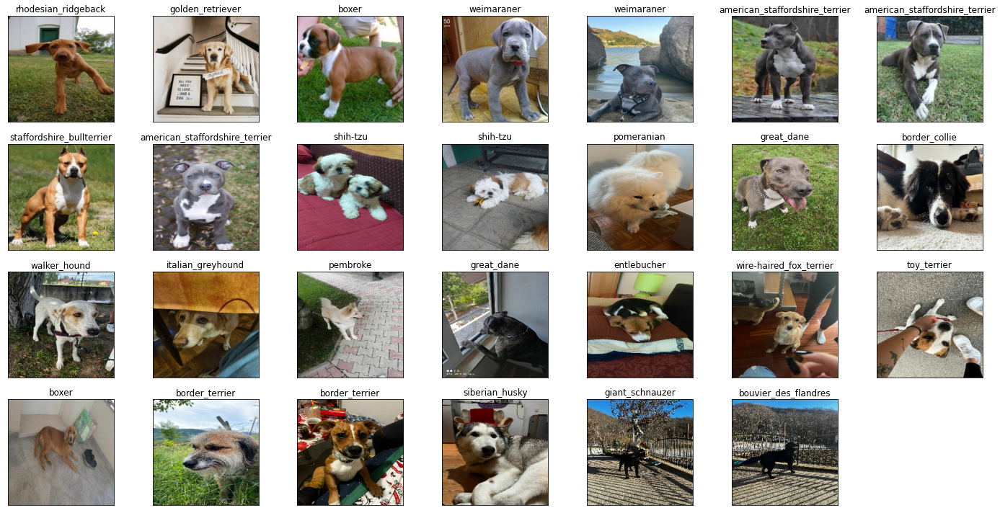

In [75]:
plt.figure(figsize=(20,10))
for i, image in enumerate(custom_images):
  plt.subplot(4,7,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)
  plt.tight_layout()

## What's next

We could try to improve the full model we trained in this notebook in a few ways. Since our early experiment (using only 1000 images) hinted at our model overfitting (the results on the training set far outperformed the results on the validation set), one goal going forward would be to try and prevent it.

1. [Trying another model from TensorFlow Hub](https://tfhub.dev/) - Perhaps a different model would perform better on our dataset. One option would be to experiment with a different pretrained model from TensorFlow Hub or look into the [`tf.keras.applications`](https://www.tensorflow.org/api_docs/python/tf/keras/applications) module.
2. [Data augmentation](https://bair.berkeley.edu/blog/2019/06/07/data_aug/) - Take the training images and manipulate (crop, resize) or distort them (flip, rotate) to create even more training data for the model to learn from.
2. [Fine-tuning](https://www.tensorflow.org/hub/tf2_saved_model#fine-tuning) - The model we used in this notebook was directly from TensorFlow Hub, we took what it had already learned from another dataset (ImageNet) and applied it to our own. Another option is to use what the model already knows and fine-tune this knowledge to our own dataset (pictures of dogs). This would mean all of the patterns within the model would be updated to be more specific to pictures of dogs rather than general images.